In [1]:
%env CUDA_DEVICE_ORDER=PCI_BUS_ID
%env CUDA_VISIBLE_DEVICES=2

env: CUDA_DEVICE_ORDER=PCI_BUS_ID
env: CUDA_VISIBLE_DEVICES=2


In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from tqdm.autonotebook import tqdm
from joblib import Parallel, delayed
import umap
import pandas as pd

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [4]:
from avgn.utils.paths import DATA_DIR, most_recent_subdirectory, ensure_dir

In [5]:
DATASET_ID = 'european_starling_gentner_segmented'

In [6]:
from avgn.utils.hparams import HParams
from avgn.dataset import DataSet

In [7]:
from avgn.signalprocessing.create_spectrogram_dataset import prepare_wav, create_label_df, get_row_audio

### create dataset

In [8]:
hparams = HParams()

In [9]:
# create a dataset object
dataset = DataSet(DATASET_ID, hparams = hparams)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 401 tasks      | elapsed:    5.5s


[Parallel(n_jobs=-1)]: Done 3805 out of 3805 | elapsed:    5.9s finished


In [10]:
dataset.sample_json

OrderedDict([('species', 'Lonchura striata domestica'),
             ('common_name', 'Sturnus vulgaris'),
             ('indvs',
              OrderedDict([('b1077',
                            OrderedDict([('syllables',
                                          OrderedDict([('start_times',
                                                        [16.338]),
                                                       ('end_times',
                                                        [16.509])]))]))])),
             ('datetime', '2017-12-18_10-39-28'),
             ('samplerate_hz', 44100),
             ('length_s', 26.09),
             ('wav_loc',
              '/mnt/cube/Datasets/starling_zenodo/b1077/wavs/2017-12-18_10-39-28-170000.wav')])

In [11]:
### parameters
n_fft=512
hop_length_ms=4
win_length_ms=10
ref_level_db=20
pre=0.97
min_level_db=-70
min_level_db_floor = -20
silence_threshold = 0.1
min_silence_for_spec=0.1
max_vocal_for_spec=1.0,
min_syllable_length_s = 0.01
spectral_range = [500, 16000]

In [12]:
import librosa
from vocalseg.utils import butter_bandpass_filter, spectrogram, int16tofloat32, plot_spec
from vocalseg.dynamic_thresholding import dynamic_threshold_segmentation
from PIL import Image
from avgn.umap import umap_reduce
import seaborn as sns

In [13]:
from itertools import islice

def window(seq, n=2, skip = 100):
    "Returns a sliding window (of width n) over data from the iterable"
    "   s -> (s0,s1,...s[n-1]), (s1,s2,...,sn), ...                   "
    it = iter(seq)
    result = tuple(islice(it, n))
    if len(result) == n:
        yield result
    for elem in it:
        result = result[1:] + (elem,)
        yield result

In [14]:
# for each wav, compute the spectrogram, break the spectrogram up into multiple segments, then project into PCA, then plot PCA projections over time

In [15]:
indvs = np.array([list(i)[0] for i in dataset.json_indv])
np.unique(indvs)

array(['b1053', 'b1060', 'b1066', 'b1076', 'b1077', 'b1125', 'b1143'],
      dtype='<U5')

In [29]:
indv = 'b1060' #'b1053'
indv_keys = np.array(list(dataset.data_files.keys()))[indvs==indv]
key = indv_keys[5]

In [54]:
window_list = [50]

In [55]:
window_length_frames

50

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/scipy/signal/signaltools.py:1344: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  out = out_full[ind]
/mnt/cube/tsainbur/Projects/github_repos/vocalization_segmentation/vocalseg/dynamic_thresholding.py:129: RuntimeWarning: invalid value encountered in sqrt
  vocal_envelope = np.max(spec, axis=0) * np.sqrt(np.mean(spec, axis=0))
Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb13865a780>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


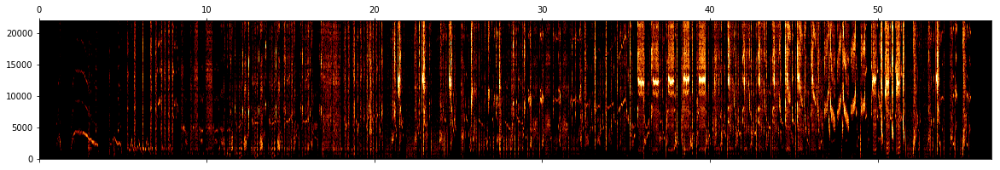

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb13865a888>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


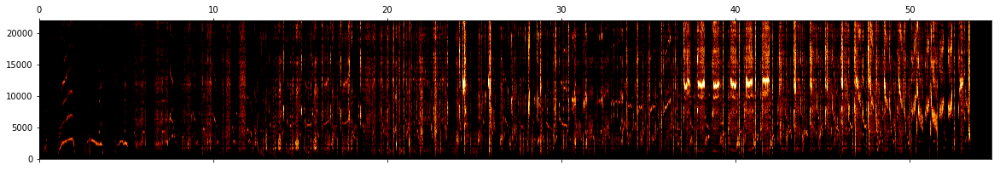

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb13865a990>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


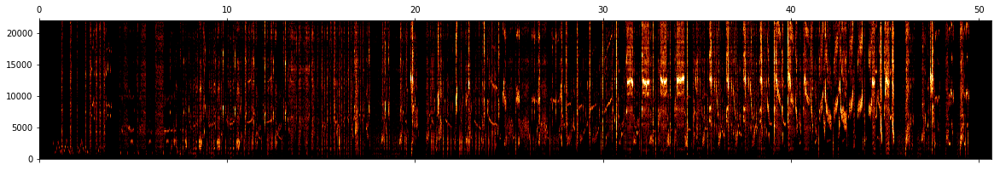

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb0f43ecc50>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


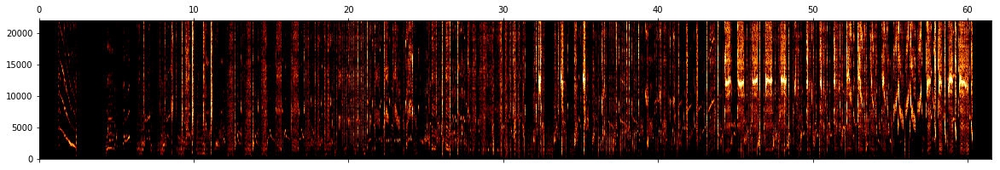

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb0b4266620>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


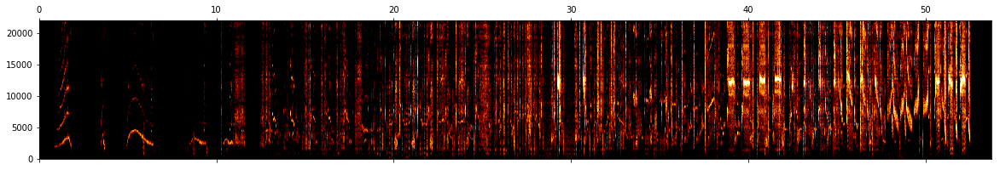

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb0645a8200>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


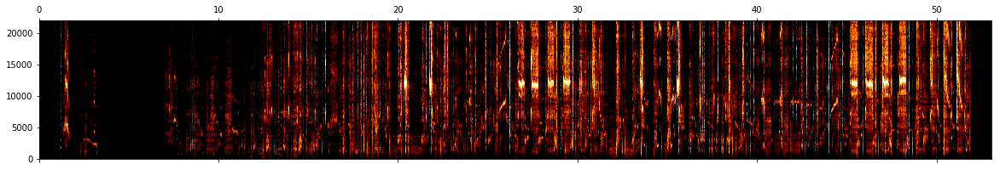

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb0645b87d8>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


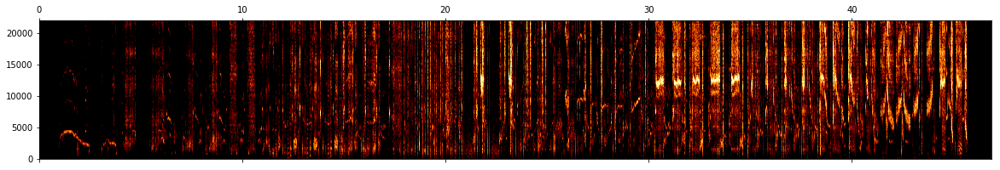

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb0642110a0>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


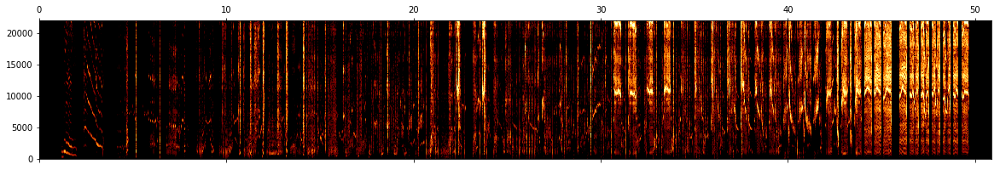

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb05ff8ec50>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


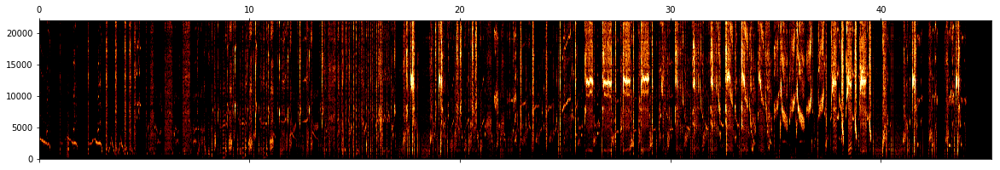

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb06414ae08>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


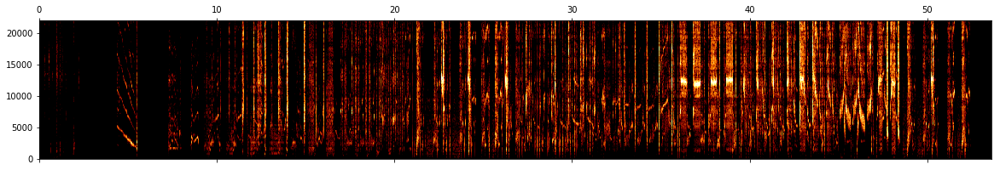

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb10c050620>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


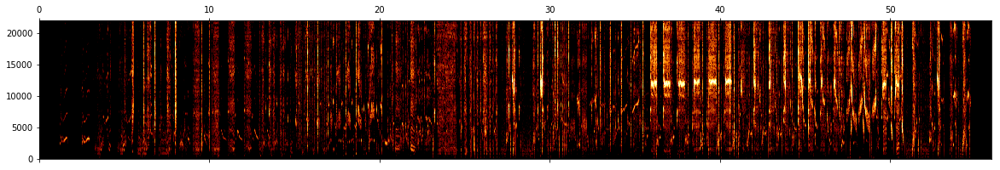

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb0a4134200>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


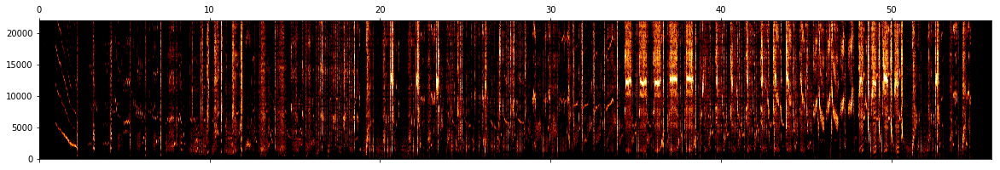

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb0f4352410>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


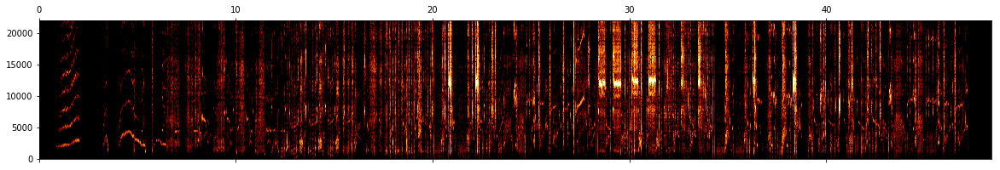

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb0ac103830>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


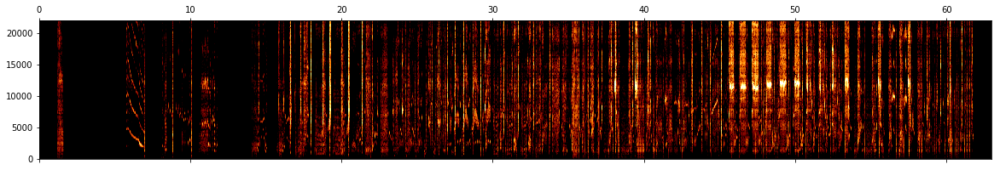

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb0b42487d8>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


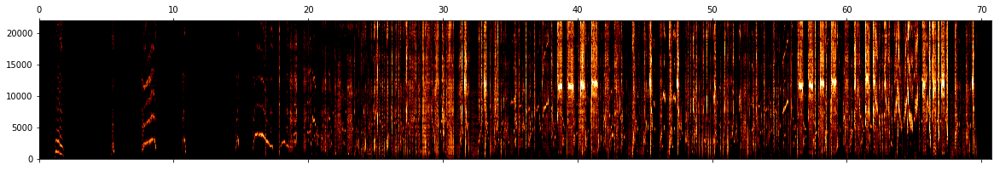

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb0645a79e8>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


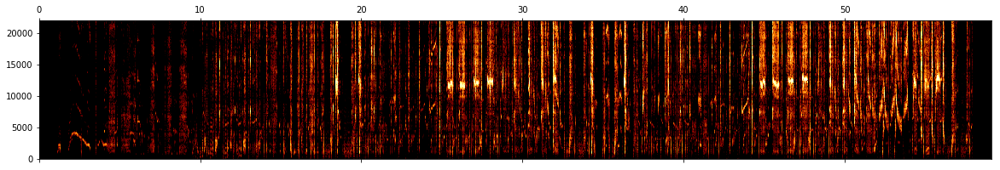

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb05fbfaca8>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


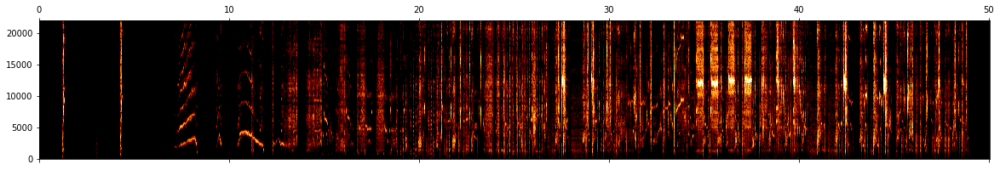

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb0641c0af0>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


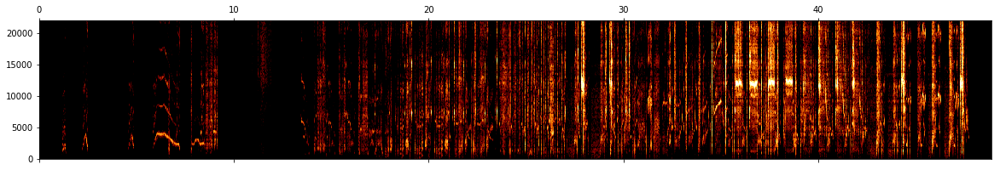

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb0b4243150>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


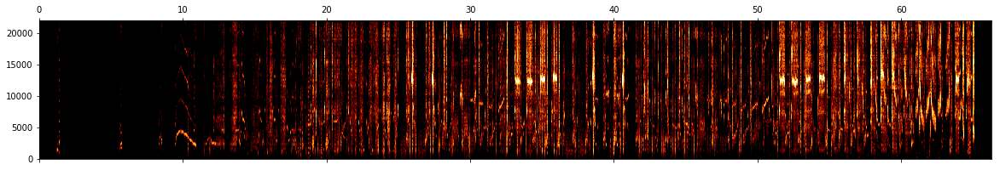

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb0b4121570>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


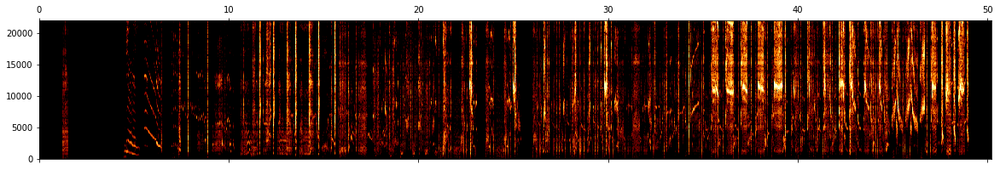

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb0f40d3ca8>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


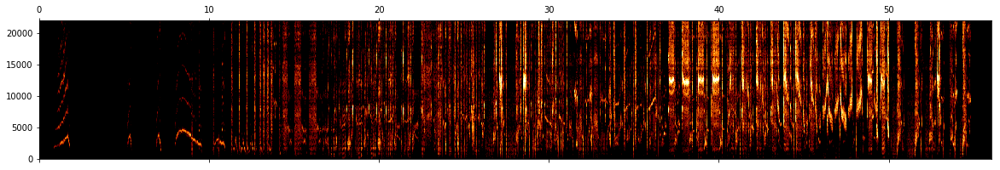

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb0f43bc360>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


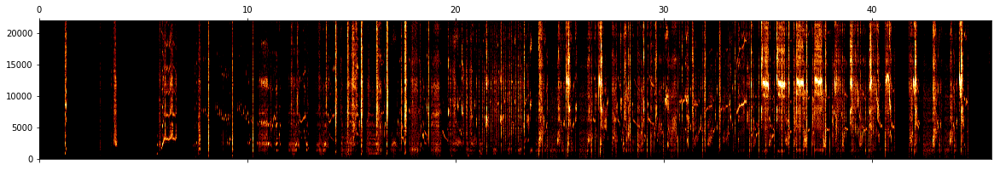

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb0ac2af200>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


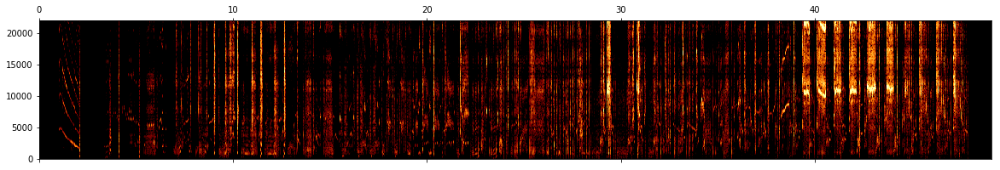

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb064134e60>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


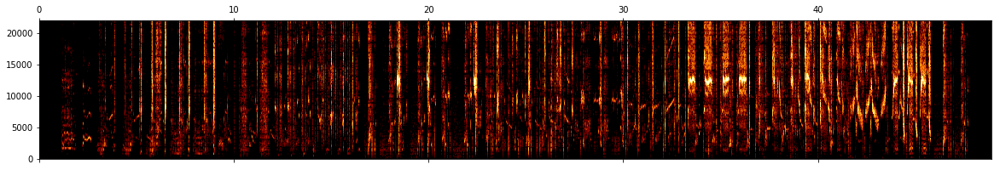

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb0f41baba0>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


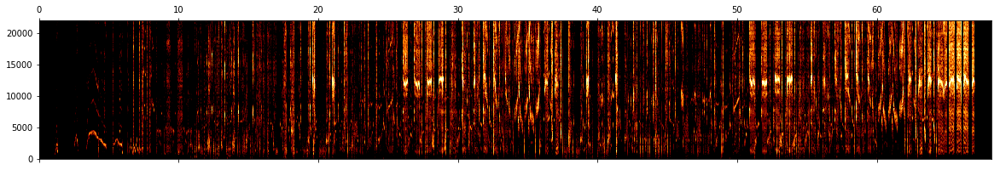

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb10c09a200>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


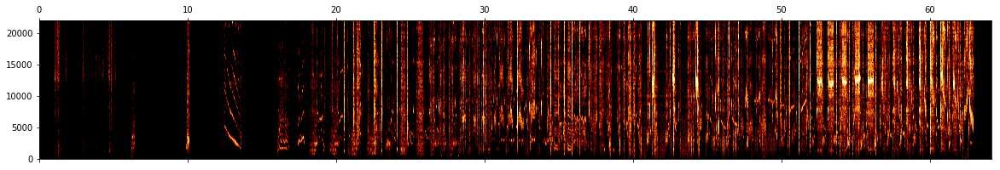

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb271c69a40>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


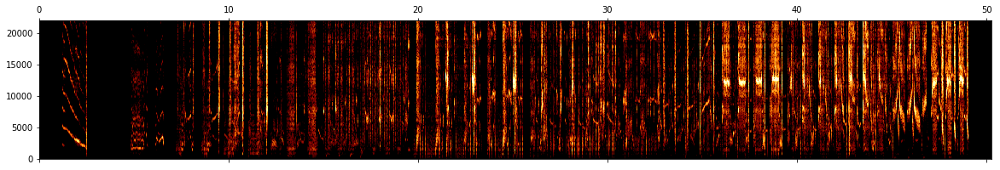

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb271c15a98>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


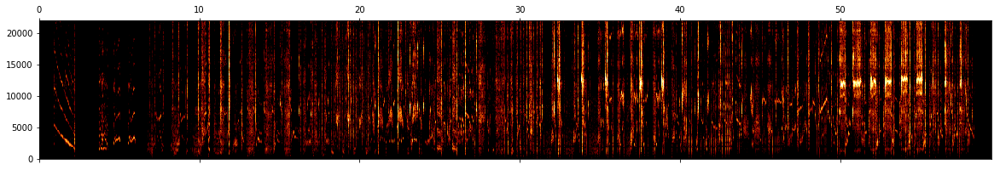

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb05f605af0>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


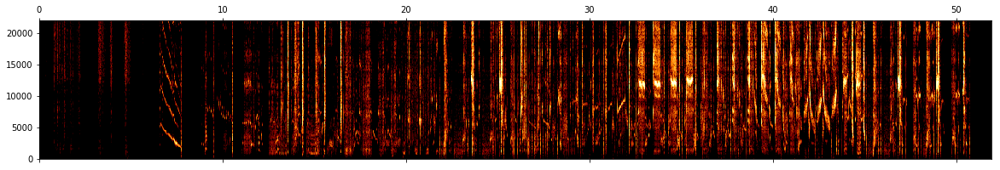

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb271c84938>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


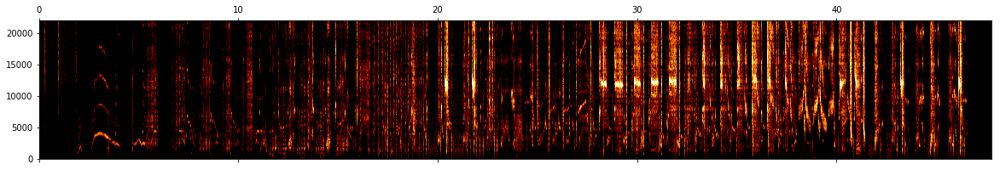

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb271960990>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


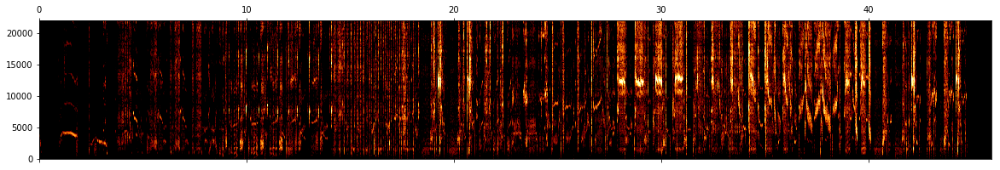

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb271ba75c8>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


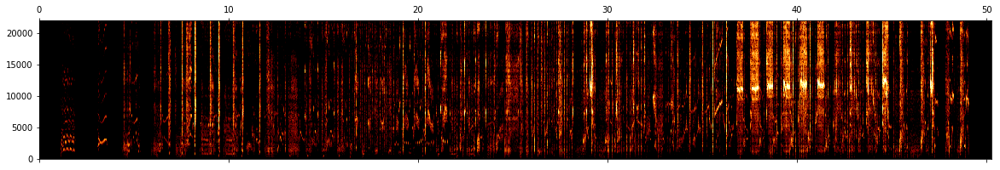

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb271a0eb48>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


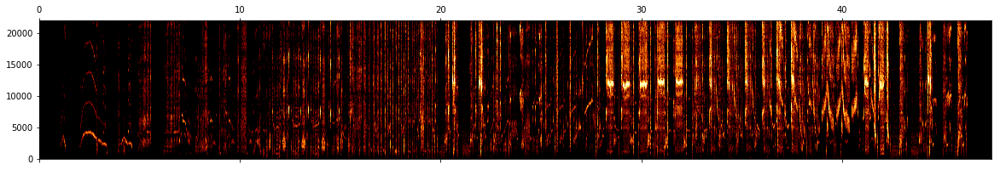

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb271a0ef68>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


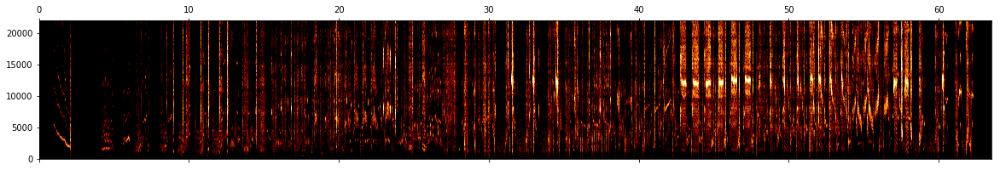

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb271c3b9e8>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


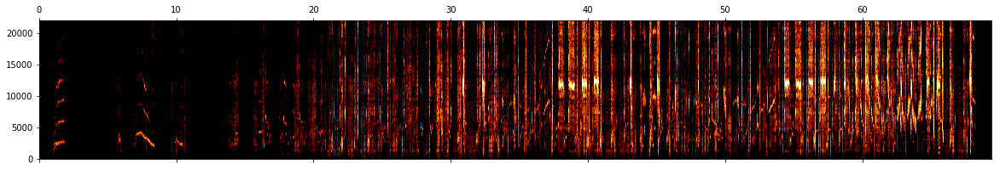

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb271c3bf10>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


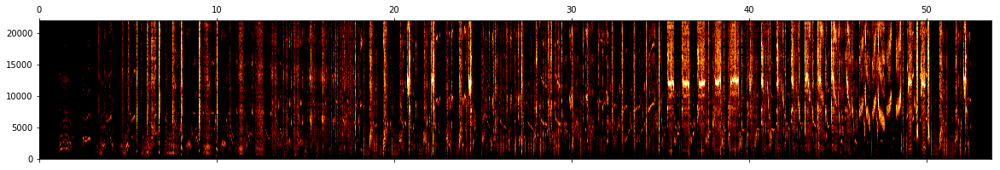

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb05f6f0888>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


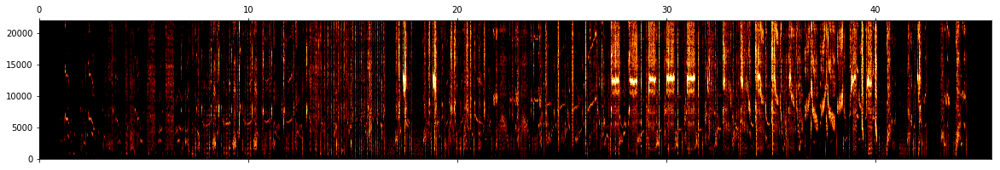

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb05f6f0fc0>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


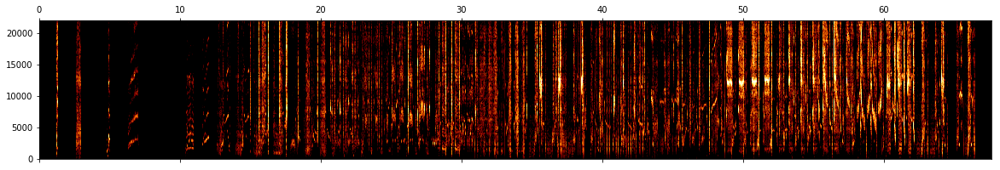

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb05f524728>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


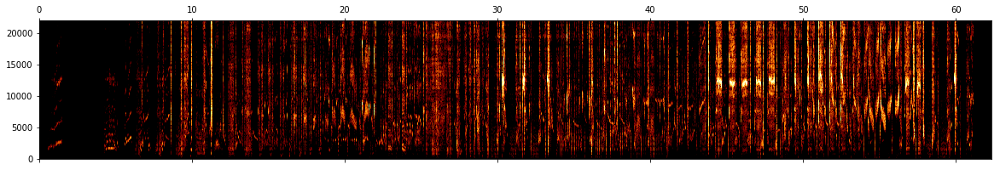

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb05f524e60>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


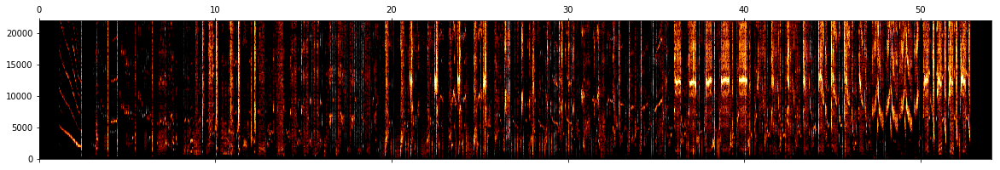

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb05f44b5c8>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


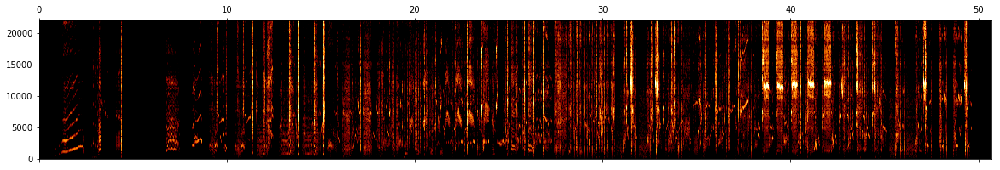

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb05f44bd00>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


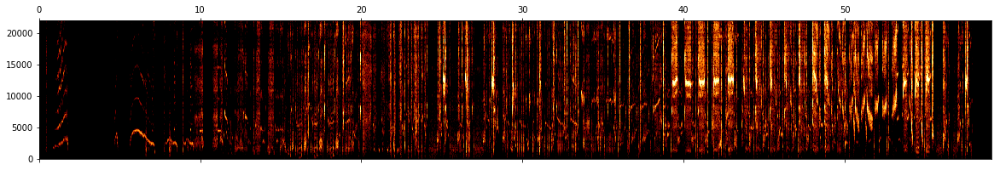

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb05f44bf10>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


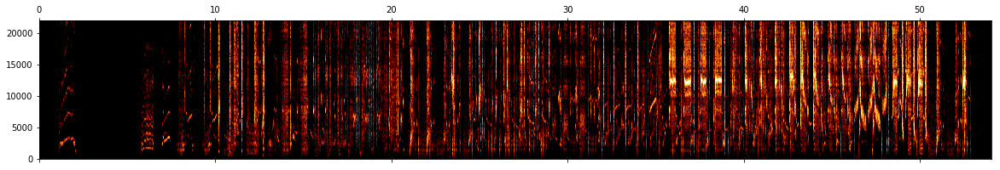

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb0f41941a8>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


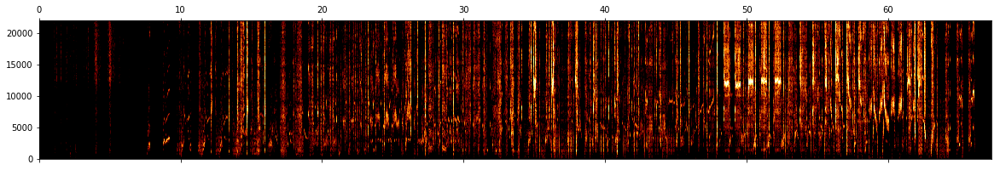

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb0f40dfeb8>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


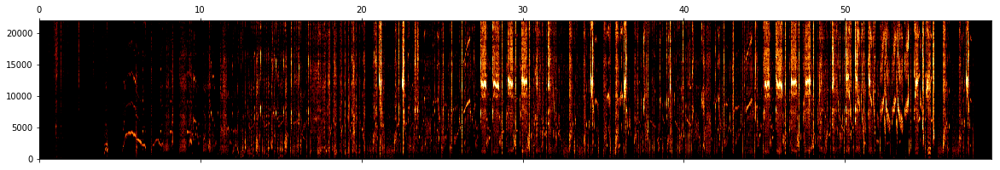

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb0f4194d00>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


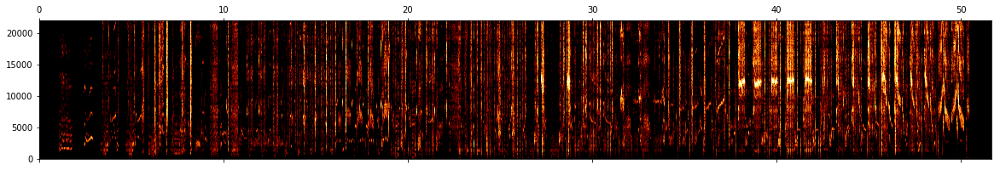

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb0ac134048>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


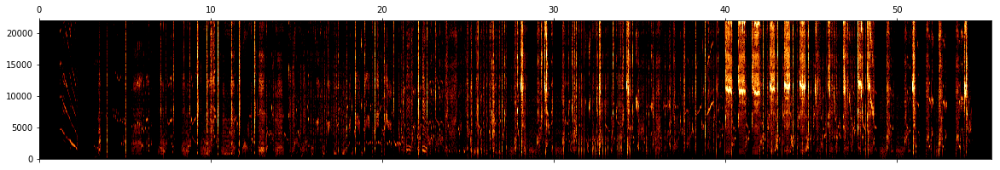

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb0642faf10>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


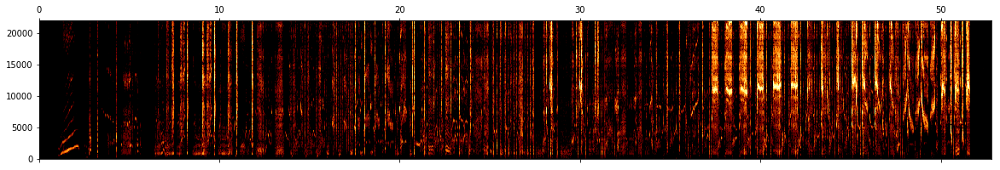

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb0f43e3360>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


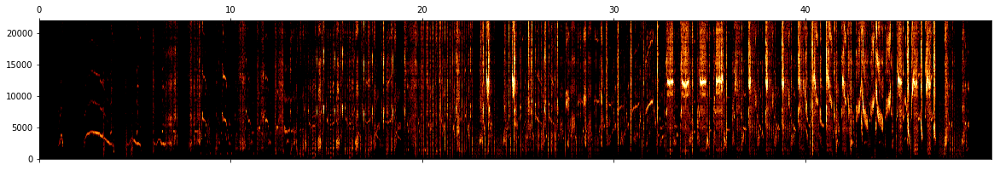

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb06440dd58>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


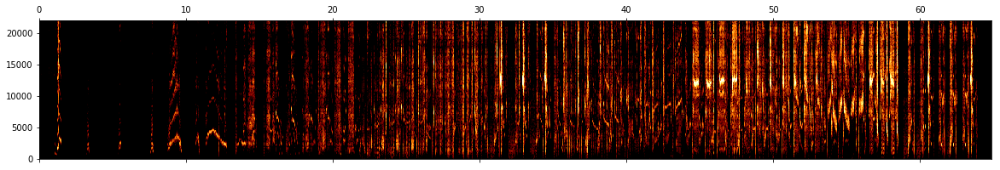

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb0ac29d258>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


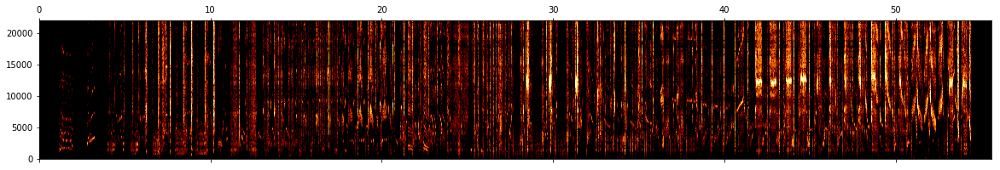

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb0f43f0ca8>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


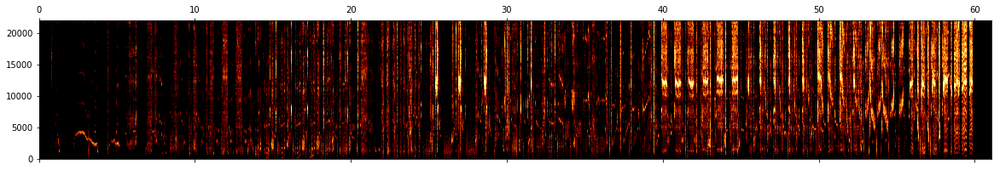

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb0f4072308>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


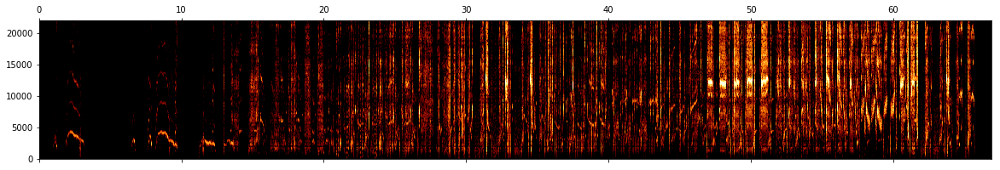

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb0b41009e8>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


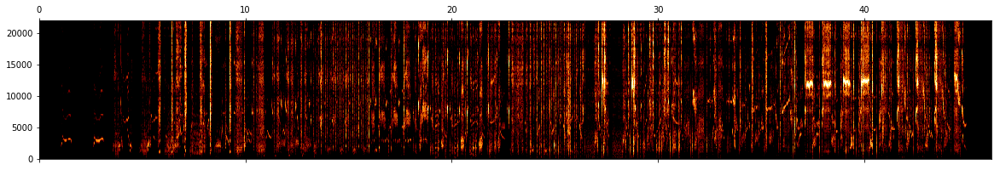

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb05fc2ddb0>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


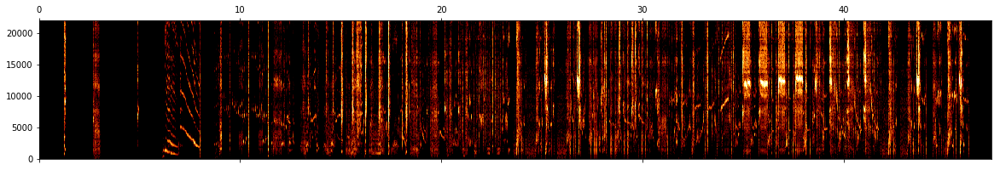

Exception ignored in: <generator object tqdm_notebook.__iter__ at 0x7fb06412bf10>
Traceback (most recent call last):
  File "/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 226, in __iter__
    self.sp(bar_style='danger')
AttributeError: 'tqdm_notebook' object has no attribute 'sp'


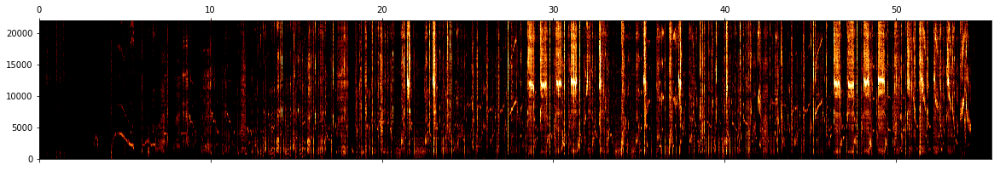

In [56]:
specs = []
key_windows = {i:{} for i in window_list}
for key in tqdm(indv_keys[:100]):
    wf = dataset.data_files[key].data['wav_loc']
    data, rate = librosa.core.load(wf, sr=None)
    data = data[int(rate*5):-int(rate*5)]
    if len(data)/rate < 45: continue
    data = butter_bandpass_filter(data, 500, 15999, rate, order = 2)
    results = dynamic_threshold_segmentation(
        data,
        rate,
        n_fft=n_fft,
        hop_length_ms=hop_length_ms,
        win_length_ms=win_length_ms,
        ref_level_db=ref_level_db,
        pre=pre,
        min_level_db=min_level_db,
        silence_threshold = silence_threshold,
        verbose=False,
        min_level_db_floor=min_level_db_floor,
        spectral_range = spectral_range,
        min_syllable_length_s = min_syllable_length_s

    )
    if results is None:
        continue
    spec = results['spec']
    spec = np.array(Image.fromarray(spec).resize((np.shape(spec)[1], 32), Image.ANTIALIAS))
    specs.append(spec)
    fig, ax = plt.subplots(figsize=(20,3))
    plot_spec(results['spec'], fig, ax, rate = rate, hop_len_ms= hop_length_ms, show_cbar=False);
    plt.show()
    
    
    #
    UMAP_dict = {}
    for window_length_ms in tqdm(window_list):
        window_length_frames = int(window_length_ms / hop_length_ms)
        windows = [i for i in window(spec.T, n=window_length_frames)]
        windows = np.reshape(windows, (len(windows), np.product(np.shape(windows)[1:])))
        key_windows[window_length_ms][key] = windows

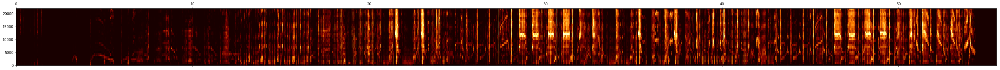

In [36]:
fig, ax = plt.subplots(figsize=(50,3))
plot_spec(spec, fig, ax, rate = rate, hop_len_ms= hop_length_ms, show_cbar=False);
plt.show()

In [57]:
rate

44100

In [60]:
window_length_ms = 50

In [61]:
all_windows = np.vstack([key_windows[window_length_ms][key] for key in key_windows[window_length_ms]])

In [62]:
np.shape(all_windows)

(772734, 384)

In [63]:
ensure_dir(DATA_DIR/'umap_windows' / DATASET_ID)
save_loc = DATA_DIR/'umap_windows' / DATASET_ID / ('starling_specs' + indv + '_' + str(window_length_ms))
np.save(save_loc.as_posix(), [list(i) for i in specs])

In [64]:
ensure_dir(DATA_DIR/'umap_windows' / DATASET_ID)
save_loc = DATA_DIR/'umap_windows' / DATASET_ID / ('starling_' + indv + '_' + str(window_length_ms))
np.save(save_loc.as_posix(), all_windows)

In [65]:
save_loc = DATA_DIR/'umap_windows' / DATASET_ID / ('keya_starling_' + indv + '_' + str(window_length_ms))
np.save(save_loc.as_posix(), indv_keys[:50])

In [66]:
window_lens = [len(key_windows[window_length_ms][key]) for key in key_windows[window_length_ms]]

In [67]:
save_loc = DATA_DIR/'umap_windows' / DATASET_ID / ('window_lengths_starling_' + indv + '_' + str(window_length_ms))
np.save(save_loc.as_posix(), window_lens)